# Logistic-Regression

This notebook will demonstrate how to perform Logistic Regression using sympyle. 


In [27]:
## Imports

%config InlineBackend.figure_format = 'retina'

import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

import matplotlib.gridspec as gridspec
from sklearn.datasets import make_blobs
import matplotlib.animation as animation
from IPython.display import HTML



# sympyle imports 
from sympyle import Tensor
from sympyle.Ops import *

## Dataset 

We will use an artificially generated dataset using sklearn's `make_blobs` function. 
It can generate clusters of data. 
We will make sure that the dataset is linearly separable.

Our dataset will contain 2 features. This makes it easy to plot on a 2d graph. 
Real world datasets have many more features. 

E.g. The number of features in a grayscale image is equal to the number of pixels in it. 

An image with a 1 megapixel resolution has 1 million features! 



Each example in our dataset will belong to a class. We represent it as 1/0. 
0 indicates its in the first class, while 1 indicates its in the second class. 


In [16]:
def load_train_set():
    X,Y = make_blobs(centers=2,cluster_std=1,random_state=800,n_samples=500)
    return X,Y

def load_grid_points():
    h = .5
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    
    return xx,yy, np.c_[xx.ravel(), yy.ravel()] 

In [17]:
X,Y = load_train_set()
Y= Y.reshape(-1,1) # make it 2d instead of 1d 
print(f"X shape is {X.shape}")
print(f"Y shape is {Y.shape}")

X shape is (500, 2)
Y shape is (500, 1)


## Visualising the dataset

Since our dataset is only 2d, we can view it on a 2d plot

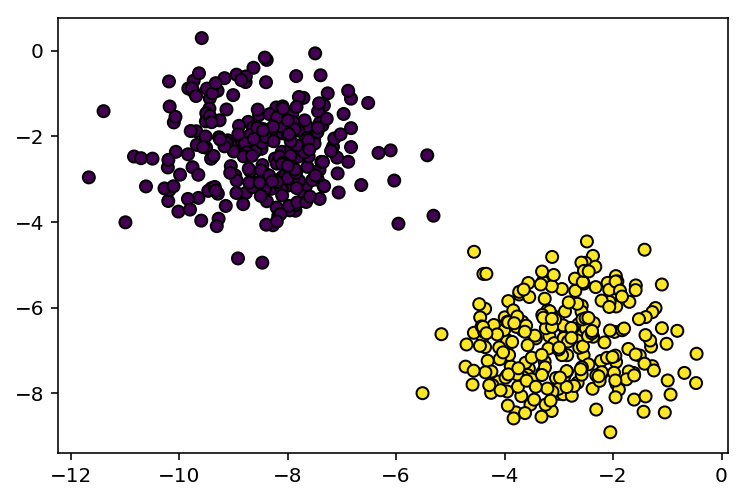

In [4]:
plt.scatter(X[:,0],X[:,1],c=Y[:,0].tolist(),edgecolors='black')
plt.show()

## Creating artificial 'test' points 

We will later need to plot the decision boundary of our model. 
There we create a huge grid of 'test points'.
We will check the model's output on each Test point later. 

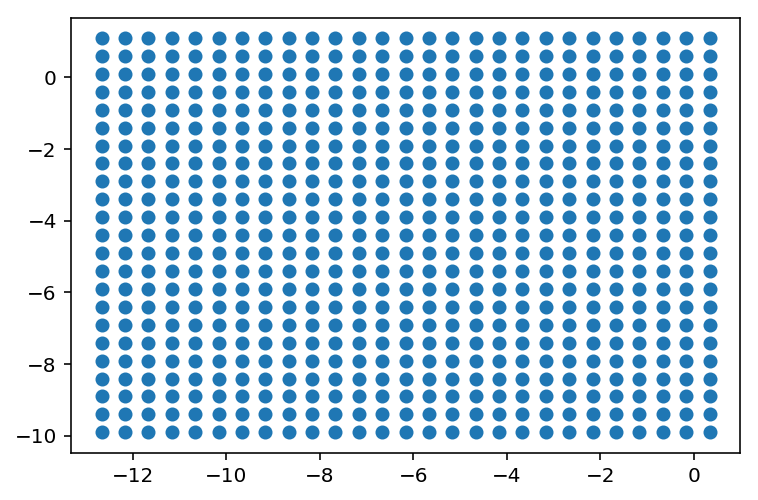

In [18]:
xx,yy,grid_points = load_grid_points()
plt.scatter(grid_points[:,0],grid_points[:,1])
plt.show()

## Model Formulation 

We will use logistic regression. 

More specifically , our model is defined as : 



\begin{align}
Matrix\ Multiply = \color{red} {Inputs}\ @\ \color{green}{Weight\ Matrix}\\\\
Bias\ Add = Matrix\ Multiply +\color{green} {Bias\ Vector} \\\\
output = Sigmoid(Bias\ Add)\\
\end{align}

Operands with $\color{red}{red}$ indicate that it is coming from our data, while operands with $\color{green}{green} $ indicate that they are randomly initialised before training.


## Optimizing our model 

The model's weights are initialised randomly, which means it hasnt learned anything. We need to come up with a way
to optimise the model's weights. 


We will use **Binary Cross Entropy loss**, which is given as

\begin{align}
targets*log(output) + (1-targets)*log(1-output)
\end{align}




In [19]:
np.random.seed(100)
weight_mat = np.random.randn(2,1)
bias_mat = np.random.randn(1)

## Setting up the Computational Graph 

Now that we know how to describe our training process, we must define it in sympyle. 

In [23]:
inputs = Tensor(X.copy())
targets = Tensor(Y.copy())

weight_l1 = Tensor(weight_mat)
bias_l1 = Tensor(bias_mat)

matmul = Matmul(inputs,weight_l1) 
bias_add = matmul + bias_l1
sigmoid = Sigmoid(bias_add)

cross_entropy = BinaryCrossEntropyLoss(sigmoid,targets)

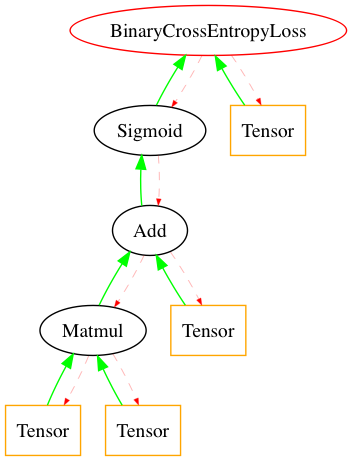

In [24]:
arr = cross_entropy.draw_graph()
Image(arr)

## Training

sympyle automatically calculates gradients for all nodes in the graph. 
In order to train, the derivatites are used to update the current weights. 


In [25]:
preds_history = []
loss_history = []
def store_pred_mesh(X):
    
    inputs.value = grid_points.copy()
    cross_entropy.clear()
    Z = sigmoid.forward()
    Z[Z>=.5] =1 
    Z[Z<.5] = 0
    preds_history.append(Z)

    
for i in range(1000):
    cross_entropy.clear() 
    
    store_pred_mesh(X)
    inputs.value = X
    cross_entropy.clear()

    loss = cross_entropy.forward()
    loss_history.append(loss)
    cross_entropy.backward()
    
    weight_l1.value -=.001* weight_l1.backward_val
    bias_l1.value -= .001* bias_l1.backward_val


In [26]:
%%capture
gs = gridspec.GridSpec(2, 2,height_ratios=[1,.2],width_ratios=[1,1])
fig = plt.figure(figsize=(30,30))
ax0  =  plt.subplot(gs[0,0])
ax1  =  plt.subplot(gs[0,1])
ax2  =  plt.subplot(gs[1,:])
ax2.axis("off")


ax0.set_title("Classification boundary",fontsize=50)


ax1.set_title("Loss",fontsize=50)
ax1.set_ylim(0,10)
ax1.set_xlim(0,1000)


cont = ax0.contourf(xx,yy,preds_history[0].reshape(xx.shape))
text = ax2.text(0.5,.5,f"Step: 0",fontsize=50,ha='center')


def animate(i): 
    frame = i*20

    cont = preds_history[frame]
    plot = ax0.contourf(xx,yy,cont.reshape(xx.shape))
    plot = ax0.scatter(X[:,0],X[:,1],c=Y[:,0].tolist(),edgecolors='black') 

    plot = ax1.scatter([i for i in range(frame)],loss_history[:frame],color='red',s=1)

    
    text.set_text(f"Step: {frame}")

    return 

anim = animation.FuncAnimation(fig, animate, frames=50,interval=10)


In [11]:
HTML(anim.to_jshtml())